#Requirements and Dataset

In [0]:
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-bi0pnnyn
  Stored in directory: /tmp/pip-ephem-wheel-cache-u2xbk7uk/wheels/11/27/c8/4ed56de7b55f4f61244e2dc6ef3cdbaff2692527a2ce6502ba
Successfully built keras-contrib


In [0]:
import datetime
import matplotlib.pyplot as plt
import sys
import numpy as np
import os
import glob
import imageio
from skimage.transform import resize

from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam

%matplotlib inline

Using TensorFlow backend.


In [0]:
%%bash
FILE="maps"

if [[ $FILE != "ae_photos" && $FILE != "apple2orange" && $FILE != "summer2winter_yosemite" &&  $FILE != "horse2zebra" && $FILE != "monet2photo" && $FILE != "cezanne2photo" && $FILE != "ukiyoe2photo" && $FILE != "vangogh2photo" && $FILE != "maps" && $FILE != "cityscapes" && $FILE != "facades" && $FILE != "iphone2dslr_flower" && $FILE != "ae_photos" ]]; then
    echo "Available datasets are: apple2orange, summer2winter_yosemite, horse2zebra, monet2photo, cezanne2photo, ukiyoe2photo, vangogh2photo, maps, cityscapes, facades, iphone2dslr_flower, ae_photos"
    exit 1
fi

URL=https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/$FILE.zip
ZIP_FILE=./datasets/$FILE.zip
TARGET_DIR=./datasets/$FILE
mkdir -p ./datasets
mkdir -p ./saved
wget -N -q $URL -O $ZIP_FILE
unzip -q $ZIP_FILE -d ./datasets/
rm $ZIP_FILE

#Data loading

Class to build training and validation batch

In [0]:
class DataLoader():
    def __init__(self, dataset_name, img_res=(128, 128)):
        self.dataset_name = dataset_name
        self.img_res = img_res

    def load_data(self, domain, batch_size=1, is_testing=False):
        data_type = "train%s" % domain if not is_testing else "test%s" % domain
        path = glob.glob('./datasets/%s/%s/*' % (self.dataset_name, data_type))

        batch_images = np.random.choice(path, size=batch_size)

        imgs = []
        for img_path in batch_images:
            img = self.imread(img_path)
            img = resize(img, self.img_res)
            imgs.append(img)

        imgs = np.array(imgs)/127.5 - 1.

        return imgs

    def load_batch(self, batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "val"
        path_A = glob.glob('datasets/%s/%sA/*' % (self.dataset_name, data_type))
        path_B = glob.glob('datasets/%s/%sB/*' % (self.dataset_name, data_type))

        self.n_batches = int(min(len(path_A), len(path_B)) / batch_size)
        total_samples = self.n_batches * batch_size

        # samples from both domains
        path_A = np.random.choice(path_A, total_samples, replace=False)
        path_B = np.random.choice(path_B, total_samples, replace=False)

        for i in range(self.n_batches-1):
            batch_A = path_A[i*batch_size:(i+1)*batch_size]
            batch_B = path_B[i*batch_size:(i+1)*batch_size]
            imgs_A, imgs_B = [], []
            for img_A, img_B in zip(batch_A, batch_B):
                img_A = self.imread(img_A)
                img_B = self.imread(img_B)

                img_A = resize(img_A, self.img_res)
                img_B = resize(img_B, self.img_res)

                if not is_testing and np.random.random() > 0.5:
                        img_A = np.fliplr(img_A)
                        img_B = np.fliplr(img_B)

                imgs_A.append(img_A)
                imgs_B.append(img_B)

            imgs_A = np.array(imgs_A)/127.5 - 1.
            imgs_B = np.array(imgs_B)/127.5 - 1.

            yield imgs_A, imgs_B

    def imread(self, path):
        return imageio.imread(path, pilmode='RGB').astype(np.float)

# Cycle consistent GAN

In [0]:
def conv_block(layer_input, filters, f_size=4, normalization=True):
    d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
    d = LeakyReLU(alpha=0.2)(d)
    if normalization:
        d = InstanceNormalization()(d)
    return d

def deconv_block(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
    u = UpSampling2D(size=2)(layer_input)
    u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
    if dropout_rate:
        u = Dropout(dropout_rate)(u)
    u = InstanceNormalization()(u)
    u = Concatenate()([u, skip_input])
    return u
        
def build_generator(img_shape,num_filter,num_channels):
    d0 = Input(shape=img_shape)
        
    # Downsampling
    d1 = conv_block(d0, num_filter)
    d2 = conv_block(d1, num_filter * 2)
    d3 = conv_block(d2, num_filter * 4)
    d4 = conv_block(d3, num_filter * 8)
        
    # Upsampling
    u1 = deconv_block(d4, d3, num_filter * 4)
    u2 = deconv_block(u1, d2, num_filter * 2)
    u3 = deconv_block(u2, d1, num_filter)
        
    u4 = UpSampling2D(size=2)(u3)
    output_img = Conv2D(num_channels, kernel_size=4, strides=1, padding='same', activation='tanh')(u4)
        
    return Model(d0, output_img)
        
def build_discriminator(img_shape,num_filter):
    img = Input(shape=img_shape)
        
    d1 = conv_block(img, num_filter, normalization=False)
    d2 = conv_block(d1, num_filter * 2)
    d3 = conv_block(d2, num_filter * 4)
    d4 = conv_block(d3, num_filter * 8)
        
    validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)
        
    return Model(img, validity)

In [0]:
class CycleGAN():
    def __init__(self, img_rows=128, img_cols=128, channels=3, dataset_name='maps'):
        self.img_rows = img_rows
        self.img_cols = img_cols
        self.channels = channels
        self.img_shape = (img_rows, img_cols, channels)
        
        self.dataset_name = dataset_name
        self.data_loader = DataLoader(self.dataset_name, img_res=(self.img_rows, self.img_cols))
        
        if not os.path.isdir('images'):
            os.mkdir('images', 0o755)
        if not os.path.isdir(os.path.join('images', self.dataset_name)):
            os.mkdir(os.path.join('images', self.dataset_name), 0o755)
        
        # Calculate output shape of D 
        patch = int(self.img_rows / 2**4)
        self.disc_patch = (patch, patch, 1)
        
        # Number of filters in the first layer of G and D
        self.gf = 32
        self.df = 64
        
        # control enforcement of cycle-consistency loss
        self.lambda_cycle = 10.0
        self.lambda_id = 0.9 * self.lambda_cycle
        
        optimizer = Adam(0.0002, 0.5)
        
        # discriminators
        self.d_a = build_discriminator(self.img_shape,self.df)
        self.d_b = build_discriminator(self.img_shape,self.df)

        self.d_a.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])
        self.d_b.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])

        # generators
        self.g_ab = build_generator(self.img_shape,self.gf,self.channels)
        self.g_ba = build_generator(self.img_shape,self.gf,self.channels)
        
        # Input the images
        img_a = Input(shape=self.img_shape)
        img_b = Input(shape=self.img_shape)
       
        translated_b = self.g_ab(img_a)
        translated_a = self.g_ba(img_b)
        
        # Translate images back to original domain
        recon_a = self.g_ba(translated_b)
        recon_b = self.g_ab(translated_a)
        
        #identity mappig
        img_a_id = self.g_ba(img_a)
        img_b_id = self.g_ab(img_b)
        
        # train only the generators together
        self.d_a.trainable = False
        self.d_b.trainable = False
        
        valid_a = self.d_a(translated_a)
        valid_b = self.d_b(translated_b)
        
        self.combined = Model(inputs=[img_a, img_b], output=[valid_a, valid_b, recon_a, recon_b, img_a_id, img_b_id])
        self.combined.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'],
                             loss_weights=[1, 1, self.lambda_cycle, self.lambda_cycle, self.lambda_id, self.lambda_id], optimizer=optimizer)
        
    
    def sample_images(self, epoch, batch_i):
        r, c = 3, 4

        imgs_a = self.data_loader.load_data(domain="A", batch_size=2, is_testing=True)
        imgs_b = self.data_loader.load_data(domain="B", batch_size=2, is_testing=True)
       
        translated_b = self.g_ab.predict(imgs_a)
        translated_a = self.g_ba.predict(imgs_b)
        
        reconstr_a = self.g_ba.predict(translated_b)
        reconstr_b = self.g_ab.predict(translated_a)

        #gen_imgs = np.concatenate([imgs_a, fake_b, reconstr_a, imgs_b, fake_a, reconstr_b])
        gen_imgs = np.concatenate([imgs_a, imgs_b, translated_b, translated_a, reconstr_a, reconstr_b])

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        #titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c, figsize=(12,9))
        fig.subplots_adjust(hspace=0, wspace=0)
        cnt = 0
        for i in range(r):
            #axs[i,0].set_title(titles[i])
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("images/%s/%d_%d.png" % (self.dataset_name, epoch, batch_i))
        plt.show()
    
    def train(self, epochs, batch_size=1, sample_interval=50):
        start_time = datetime.datetime.now()
        
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)
        
        for epoch in range(epochs):
            for batch_i, (imgs_a, imgs_b) in enumerate(self.data_loader.load_batch(batch_size)):
                
                # Translate images to opposite domain
                fake_b = self.g_ab.predict(imgs_a)
                fake_a = self.g_ba.predict(imgs_b)
                
                # Train the discriminators (original images = real / translated = Fake)
                da_loss_real = self.d_a.train_on_batch(imgs_a, valid)
                da_loss_fake = self.d_a.train_on_batch(fake_a, fake)
                da_loss = 0.5 * np.add(da_loss_real, da_loss_fake)

                db_loss_real = self.d_b.train_on_batch(imgs_b, valid)
                db_loss_fake = self.d_b.train_on_batch(fake_b, fake)
                db_loss = 0.5 * np.add(db_loss_real, db_loss_fake)

                d_loss = 0.5 * np.add(da_loss, db_loss)
                
                g_loss = self.combined.train_on_batch([imgs_a, imgs_b], [valid, valid, imgs_a, imgs_b, imgs_a, imgs_b])

            if epoch % sample_interval == 0:
                print('epoch: {} generator loss: {} discriminator loss: {}'.format(epoch, g_loss, d_loss))
                self.sample_images(epoch, batch_i)
            if epoch % 33 == 0:
                save_name = 'saved/' + '{}' + str(epoch) + '.h5'
                self.g_ab.save_weights(save_name.format('GAB_weights_'))
                self.g_ba.save_weights(save_name.format('GBA_weights_'))

In [0]:
gan = CycleGAN(dataset_name='maps')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:63: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=[<tf.Tenso...)`


/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch: 0 generator loss: [10.503098, 0.983359, 1.0368872, 0.2369887, 0.20232752, 0.27435526, 0.18005463] discriminator loss: [0.0511543 0.9506836]


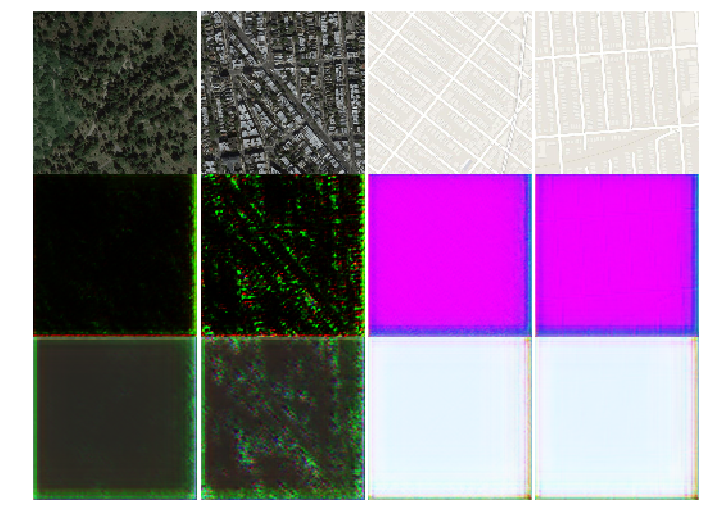

epoch: 5 generator loss: [8.640976, 0.9328737, 1.2927446, 0.24564886, 0.13054115, 0.21003473, 0.08479384] discriminator loss: [0.01900529 0.99542236]


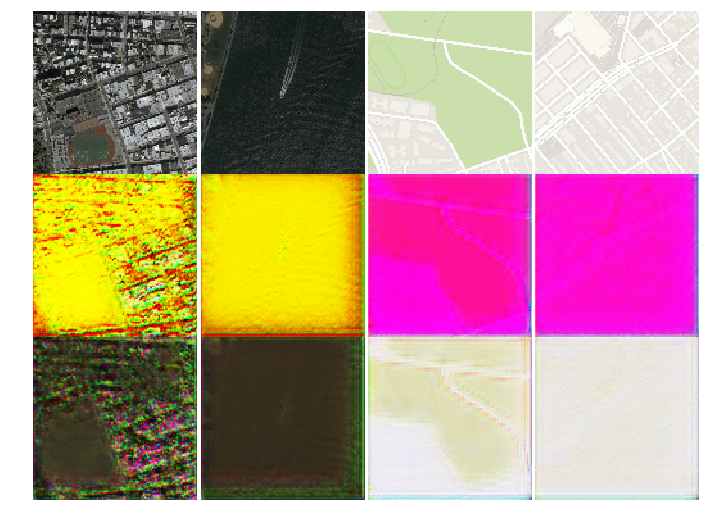

epoch: 10 generator loss: [6.798312, 1.0004367, 0.8105842, 0.16754614, 0.12131552, 0.16125593, 0.07193012] discriminator loss: [0.27746975 0.77893066]


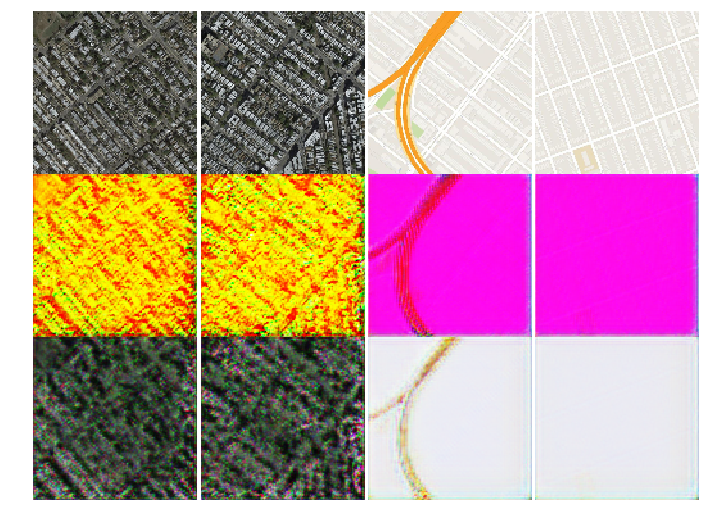

epoch: 15 generator loss: [7.1682115, 1.292128, 0.9973912, 0.15721607, 0.12514193, 0.15824951, 0.070096284] discriminator loss: [0.0614421 0.9873047]


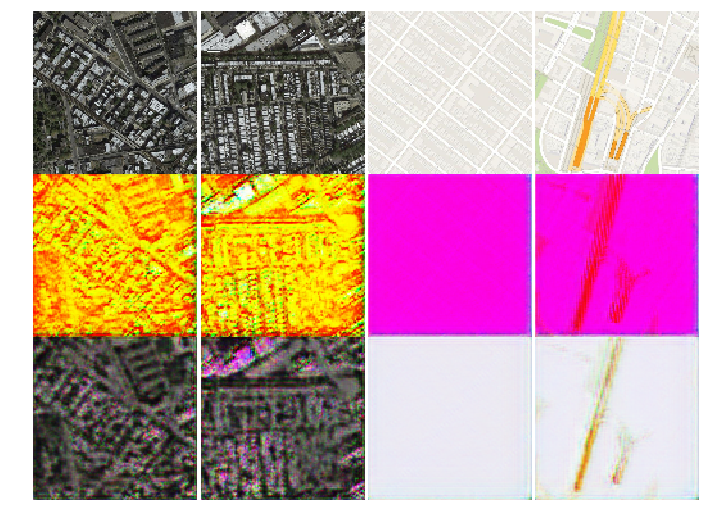

epoch: 20 generator loss: [6.2516193, 1.0408208, 1.0104547, 0.15979503, 0.0686485, 0.1490897, 0.06378903] discriminator loss: [0.00551697 0.9998779 ]


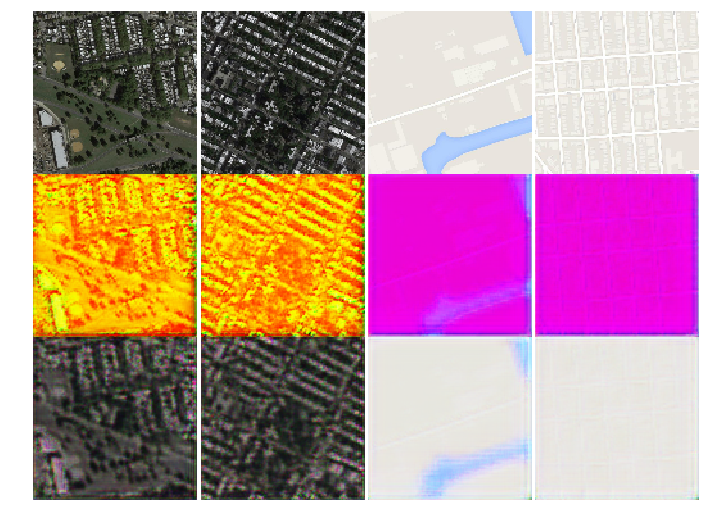

epoch: 25 generator loss: [6.174531, 1.1303898, 1.0388669, 0.14273115, 0.078009546, 0.1341034, 0.06565965] discriminator loss: [0.00641807 0.9998779 ]


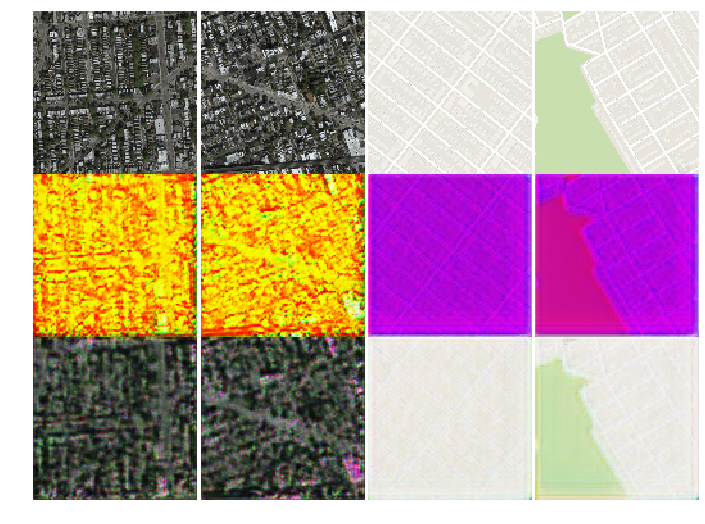

epoch: 30 generator loss: [7.2866664, 0.9631581, 1.2562472, 0.17169392, 0.13416466, 0.1486352, 0.07455095] discriminator loss: [0.18664357 0.680603  ]


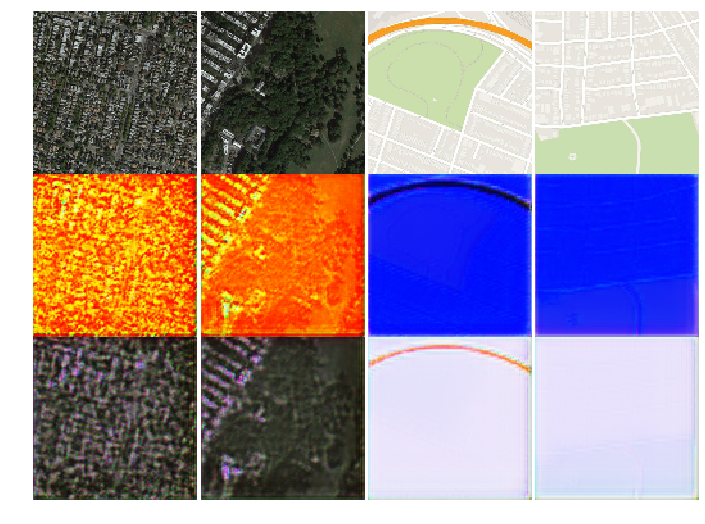

epoch: 35 generator loss: [6.137793, 0.71768546, 1.0185554, 0.16369069, 0.10986911, 0.116668135, 0.068437904] discriminator loss: [0.02150051 0.9995117 ]


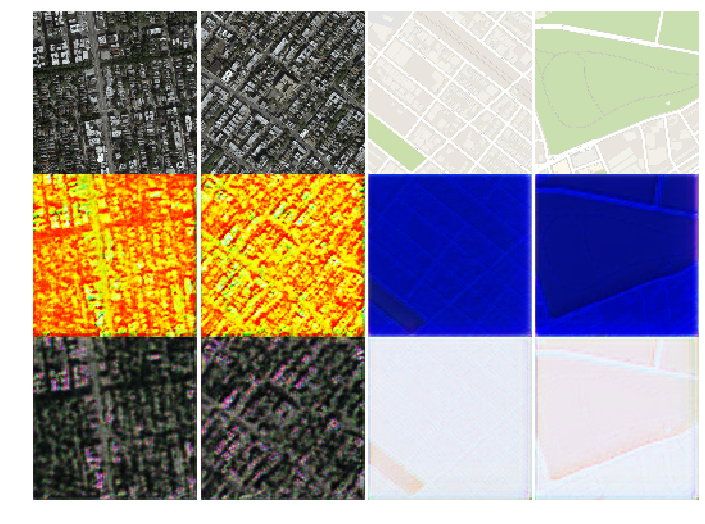

epoch: 40 generator loss: [7.0824623, 1.2212988, 0.56513494, 0.26077867, 0.11819232, 0.10844602, 0.058922708] discriminator loss: [0.2440472  0.56921387]


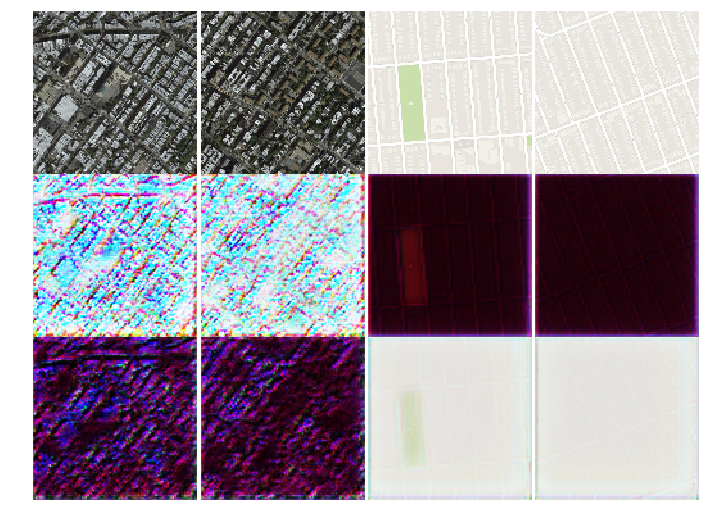

epoch: 45 generator loss: [6.6250033, 0.9808893, 0.8002589, 0.19270754, 0.13318944, 0.11482157, 0.06127681] discriminator loss: [0.18900347 0.7409668 ]


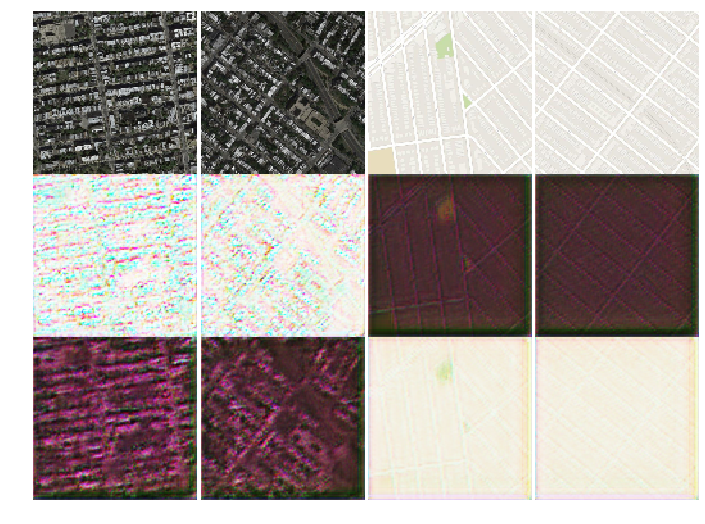

epoch: 50 generator loss: [6.3517647, 1.0356648, 0.7387358, 0.18678318, 0.10024417, 0.12495893, 0.06471774] discriminator loss: [0.15363778 0.78808594]


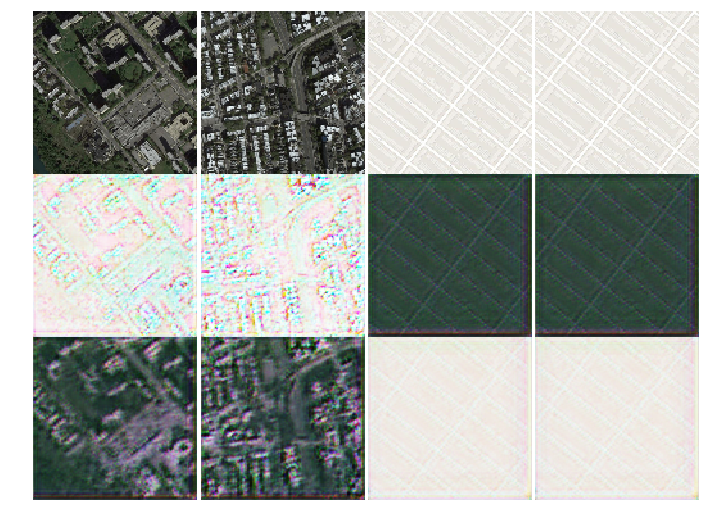

epoch: 55 generator loss: [6.5687027, 1.5682015, 0.49246037, 0.18743213, 0.09407925, 0.11389153, 0.07421152] discriminator loss: [0.2092318 0.6989136]


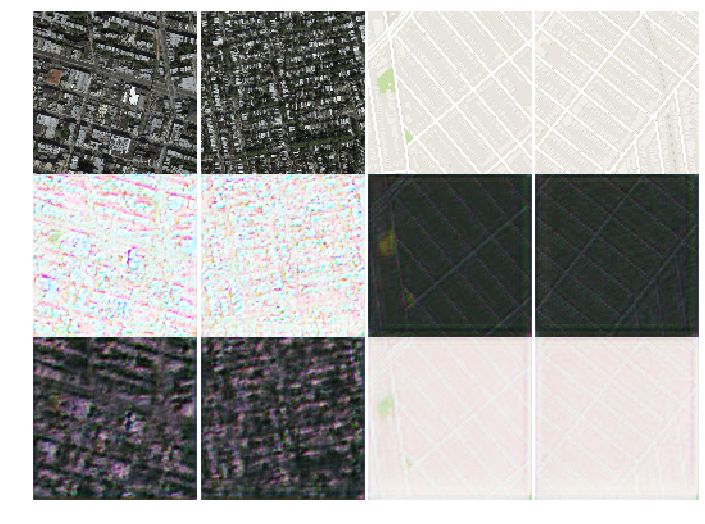

epoch: 60 generator loss: [5.820541, 1.2973995, 0.5816605, 0.15129313, 0.08531746, 0.111319736, 0.063721925] discriminator loss: [0.1826007  0.72735596]


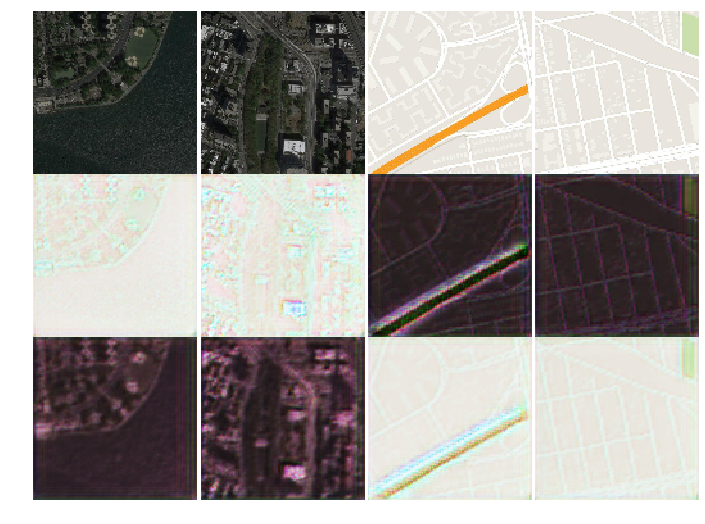

epoch: 65 generator loss: [6.547798, 1.0974674, 0.7680202, 0.20923242, 0.090680584, 0.13242492, 0.0545951] discriminator loss: [0.10799615 0.85791016]


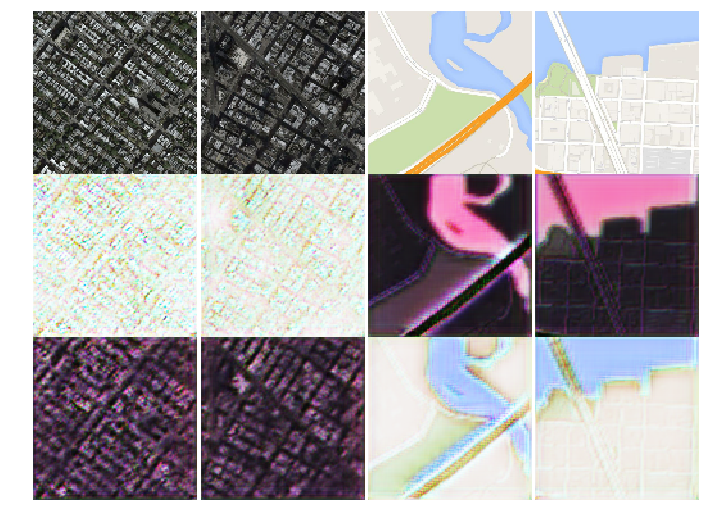

epoch: 70 generator loss: [5.296057, 1.0870821, 0.5373806, 0.14239168, 0.07383138, 0.10477629, 0.06293085] discriminator loss: [0.1338058  0.81030273]


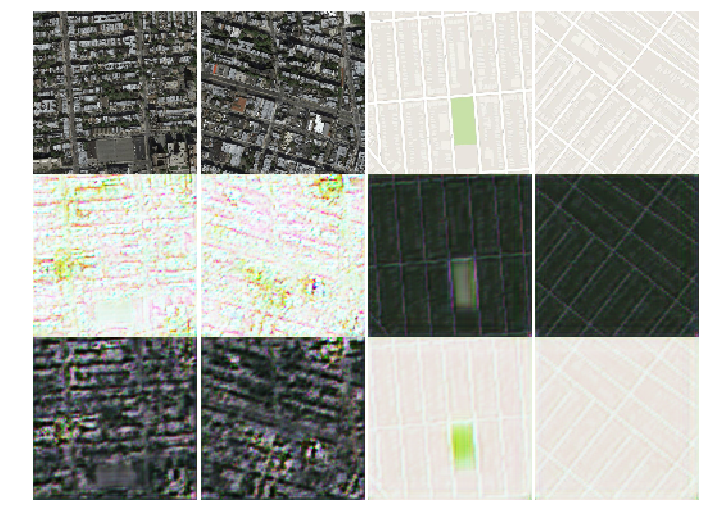

epoch: 75 generator loss: [5.310624, 0.8852391, 0.5684353, 0.15508384, 0.07858218, 0.11257078, 0.05635028] discriminator loss: [0.11579849 0.84295654]


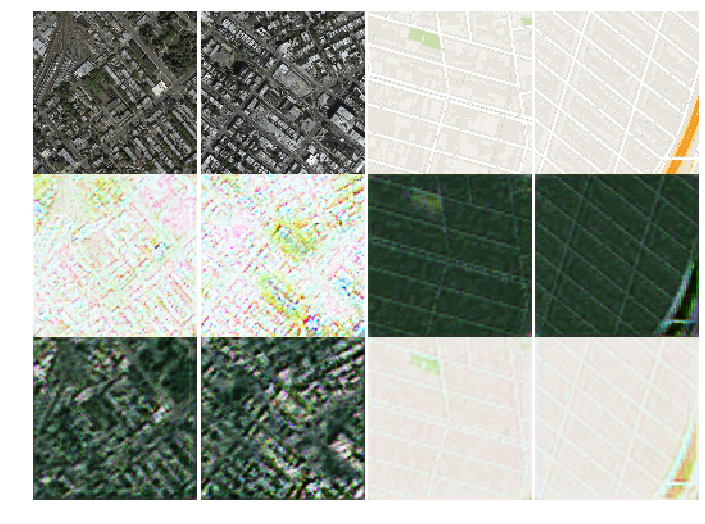

epoch: 80 generator loss: [6.0243845, 1.0537298, 0.5562549, 0.19224799, 0.10030818, 0.11164819, 0.05377829] discriminator loss: [0.13900778 0.81811523]


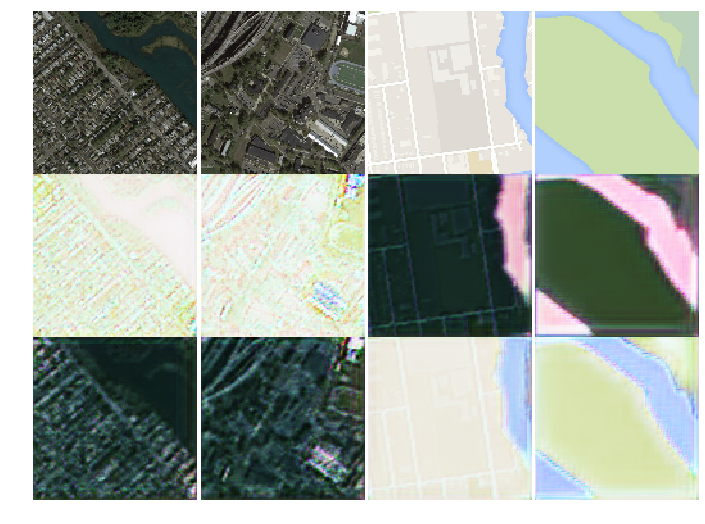

epoch: 85 generator loss: [5.8177714, 1.1867306, 0.98034525, 0.14874712, 0.074058525, 0.106965534, 0.05110549] discriminator loss: [0.11621553 0.85357666]


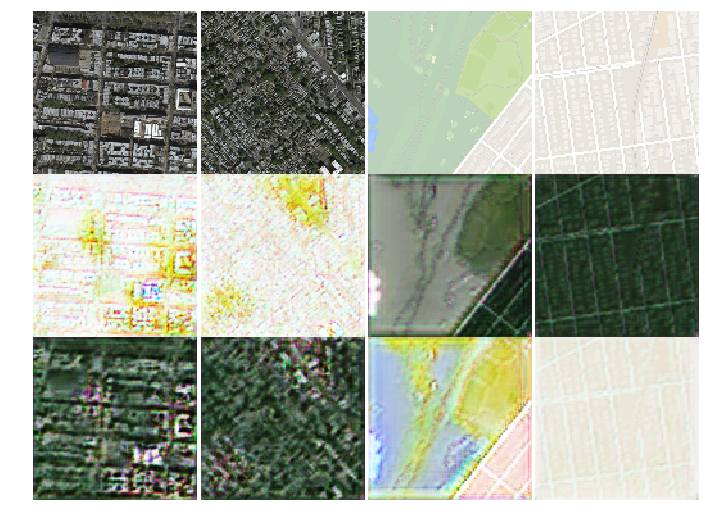

epoch: 90 generator loss: [5.8299217, 1.0742925, 0.52344847, 0.19403672, 0.08392248, 0.10031213, 0.061086617] discriminator loss: [0.11958447 0.833313  ]


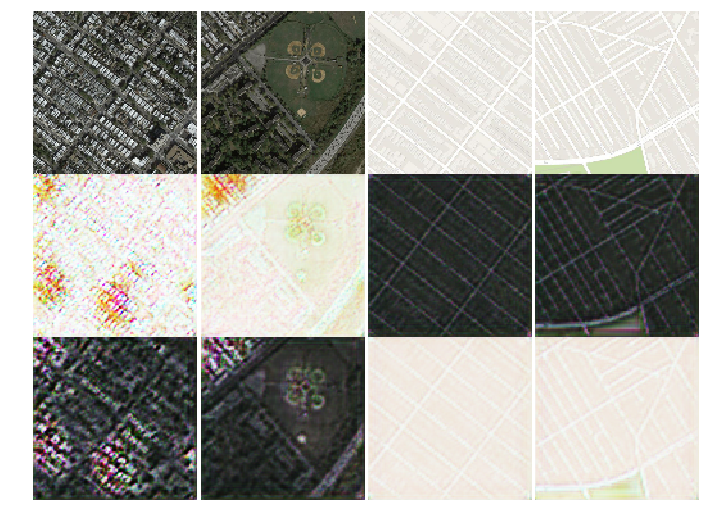

epoch: 95 generator loss: [5.786245, 0.7783202, 0.6967212, 0.16305816, 0.1179558, 0.11134578, 0.05543908] discriminator loss: [0.1502842 0.810791 ]


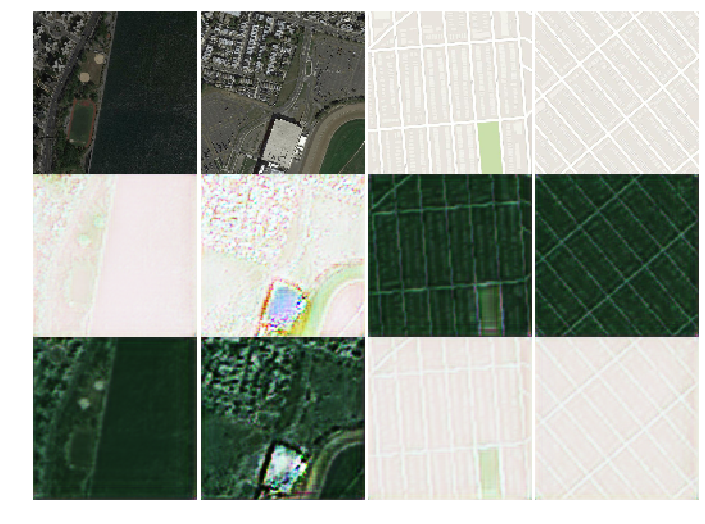

In [0]:
gan.train(epochs=100, batch_size=64, sample_interval=5)

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch: 0 generator loss: [5.6622705, 0.9096542, 0.75538903, 0.17499396, 0.07547682, 0.107725434, 0.05811002] discriminator loss: [0.14771186 0.76361084]


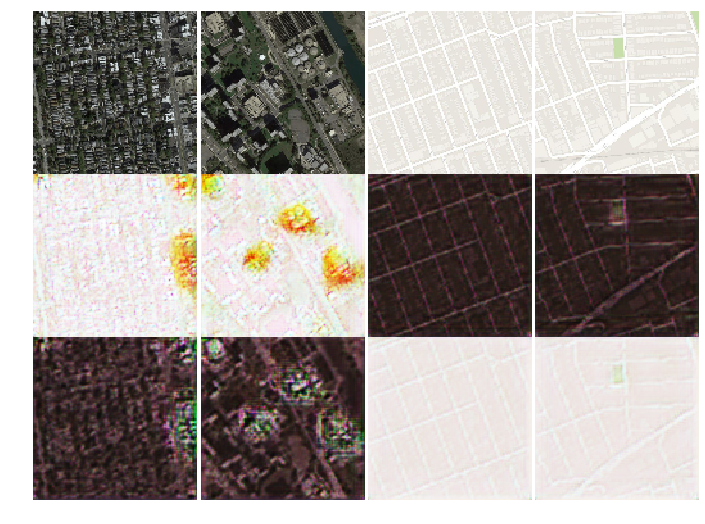

epoch: 5 generator loss: [5.40528, 0.93751425, 0.83930135, 0.16010237, 0.070062354, 0.098724514, 0.04869964] discriminator loss: [0.16850723 0.72247314]


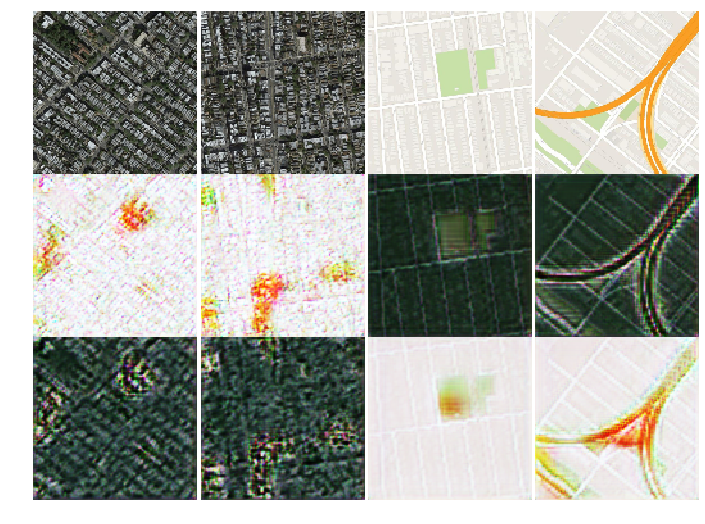

epoch: 10 generator loss: [5.6596603, 1.1611239, 0.8705001, 0.14789613, 0.08319689, 0.095716305, 0.05062885] discriminator loss: [0.12840667 0.82263184]


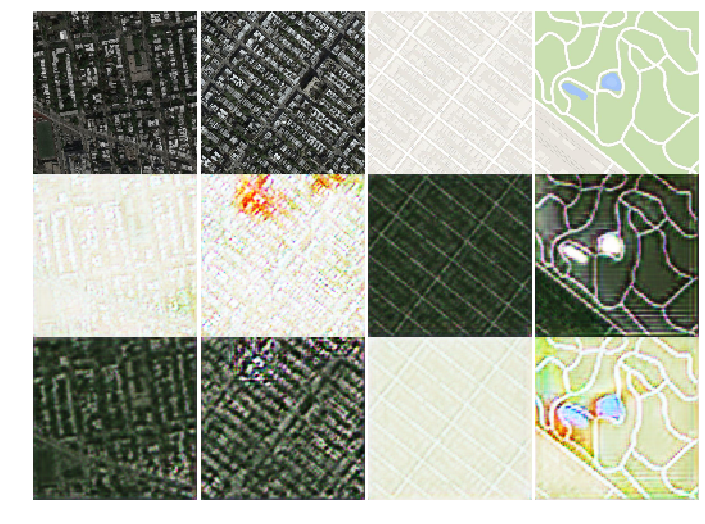

epoch: 15 generator loss: [6.056607, 1.4203432, 0.93126243, 0.16637757, 0.06786101, 0.10126688, 0.05013482] discriminator loss: [0.10480931 0.88775635]


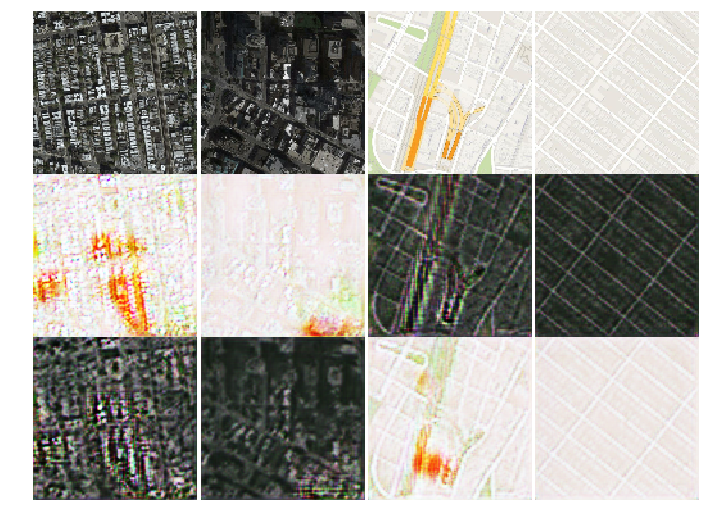

epoch: 20 generator loss: [5.262648, 1.1430951, 0.6826799, 0.13512833, 0.07799189, 0.09395238, 0.05112218] discriminator loss: [0.16952422 0.7263794 ]


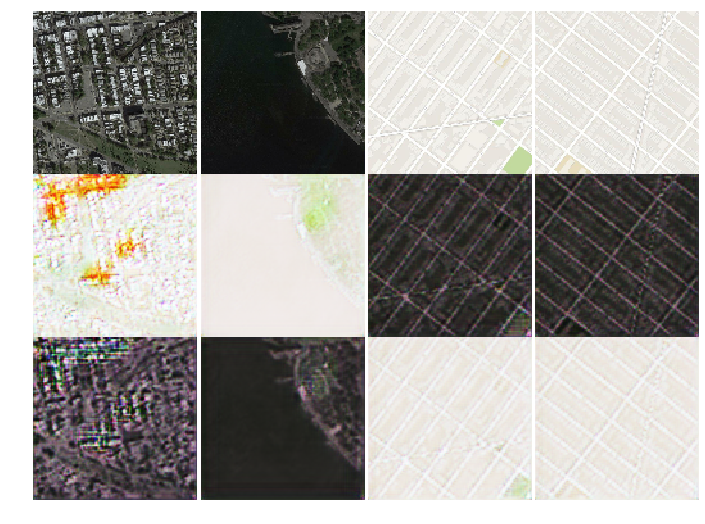

epoch: 25 generator loss: [5.335643, 1.2095869, 0.741367, 0.1375303, 0.066745125, 0.096790746, 0.052313093] discriminator loss: [0.13482803 0.7877197 ]


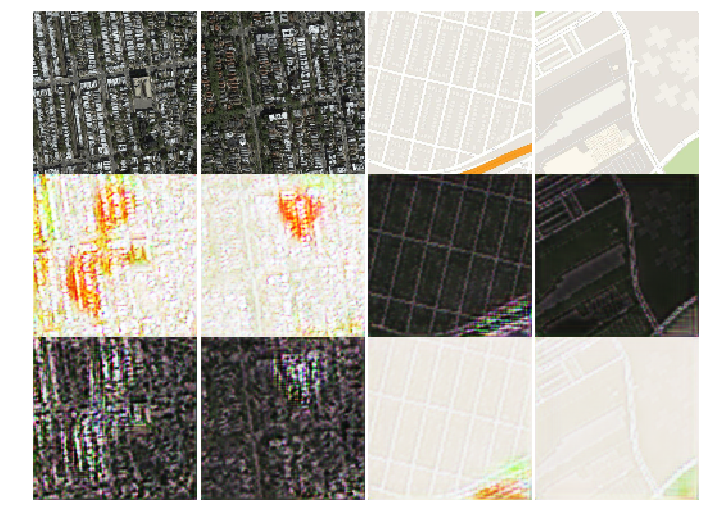

In [0]:
gan.train(epochs=30, batch_size=64, sample_interval=5)

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


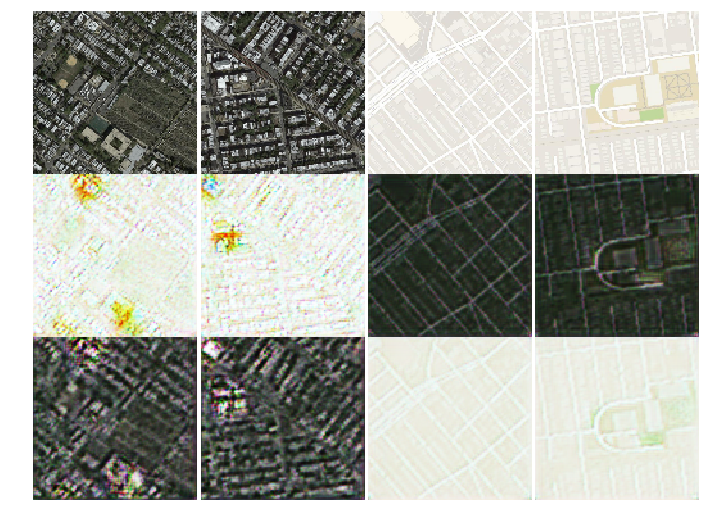

In [0]:
gan.sample_images(100, 0)

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


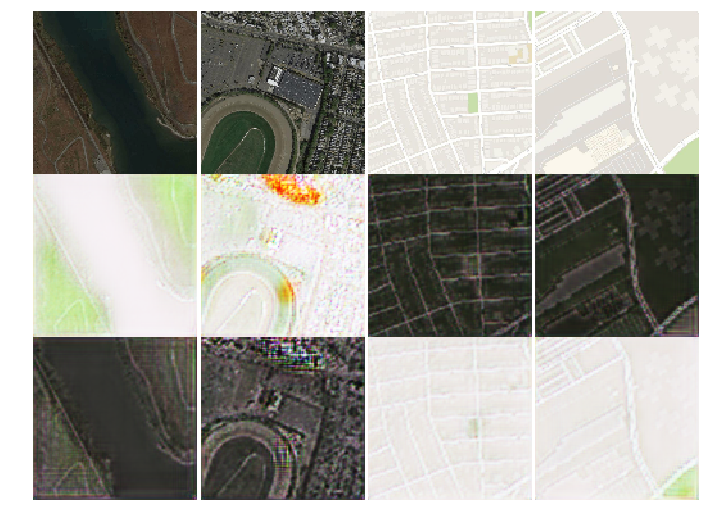

In [0]:
gan.sample_images(100, 0)

In [0]:
gan.g_ab.save_weights('GAB_weights_100.h5')
gan.g_ba.save_weights('GBA_weights_100.h5')
gan.d_a.save_weights('DA_weights_100.h5')
gan.d_b.save_weights('DB_weights_100.h5')

In [0]:
gan.g_ba.load_weights('GBA_weights_100.h5')
gan.g_ab.load_weights('GAB_weights_100.h5')

In [0]:
!zip -r maps.zip saved

  adding: saved/ (stored 0%)
  adding: saved/GAB_weights_33.h5 (deflated 9%)
  adding: saved/GBA_weights_0.h5 (deflated 9%)
  adding: saved/GBA_weights_33.h5 (deflated 9%)
  adding: saved/GBA_weights_99.h5 (deflated 9%)
  adding: saved/GAB_weights_99.h5 (deflated 9%)
  adding: saved/GAB_weights_0.h5 (deflated 9%)
  adding: saved/GAB_weights_66.h5 (deflated 9%)
  adding: saved/GBA_weights_66.h5 (deflated 9%)


In [0]:
from google.colab import files
files.download('maps.zip')